Download a real world dataset containing at least 1000 samples and more than 10 features. Perform exploratory data analysis to understand the dataset's structure. Apply Linear Discriminant Analysis for dimensionality reduction, ensuring class separability. Visualize the transformed dataset using different linear discriminants and analyze the effectiveness of LDA in improving class separation.

In [4]:
import pandas as pd
import numpy as np
from ucimlrepo import fetch_ucirepo
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, QuantileTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
plt.style.use('ggplot')

In [ ]:
from sklearn.datasets import load_wine
wine_data = load_wine()

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]], shape=(178, 13))

In [3]:
wine_quality = fetch_ucirepo(id=186)
wq_X = wine_quality.data.features
wq_y = wine_quality.data.targets

In [4]:
wq_y.value_counts()

quality
6          2836
5          2138
7          1079
4           216
8           193
3            30
9             5
Name: count, dtype: int64

In [5]:

wq_X

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8


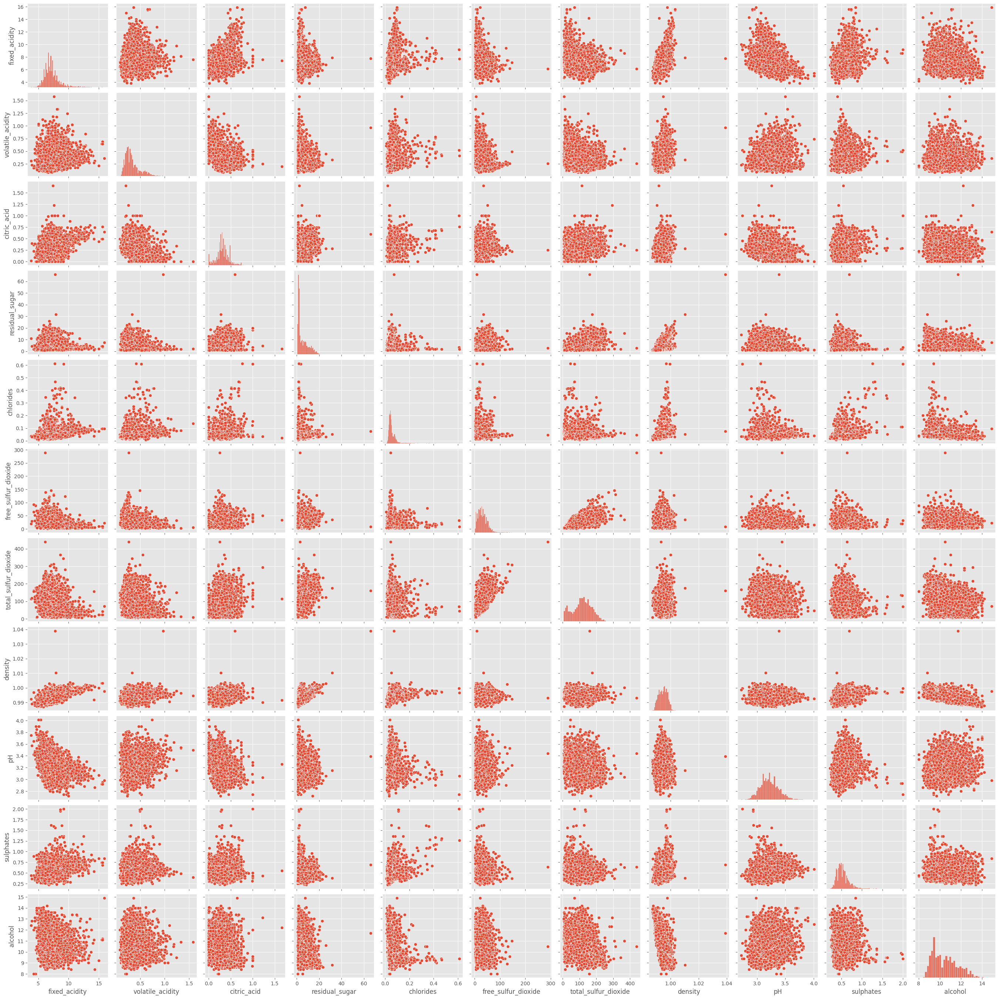

In [8]:
# plt.figure(figsize=(700, 700))
sns.pairplot(wq_X)

In [6]:
wq_y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
6492,6
6493,5
6494,6
6495,7


In [10]:
wq_y["quality"] = wq_y["quality"].apply(lambda x: 1 if x > 6 else 0)
wq_y.value_counts()

C:\Users\Predator\AppData\Local\Temp\ipykernel_10276\662577714.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wq_y["quality"] = wq_y["quality"].apply(lambda x: 1 if x > 6 else 0)


quality
0          5220
1          1277
Name: count, dtype: int64

In [7]:
wq_y["quality"].value_counts()

quality
6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: count, dtype: int64

Checking for null values

In [8]:
print(wq_X.isnull().sum())
print(wq_y.isnull().sum())

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
dtype: int64
quality    0
dtype: int64


In [9]:
wq_X.describe()


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000


Plotting boxplots to check whether there are any outliers

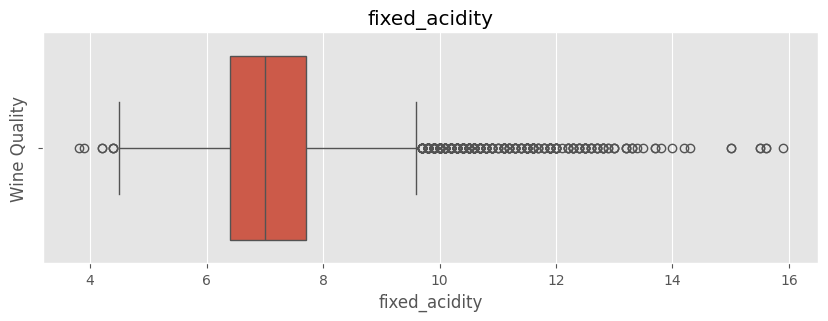

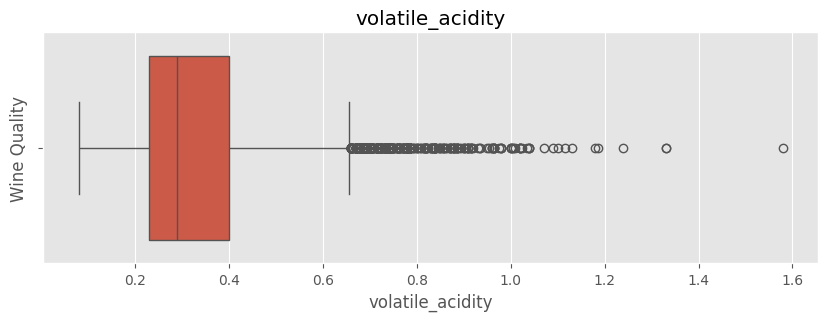

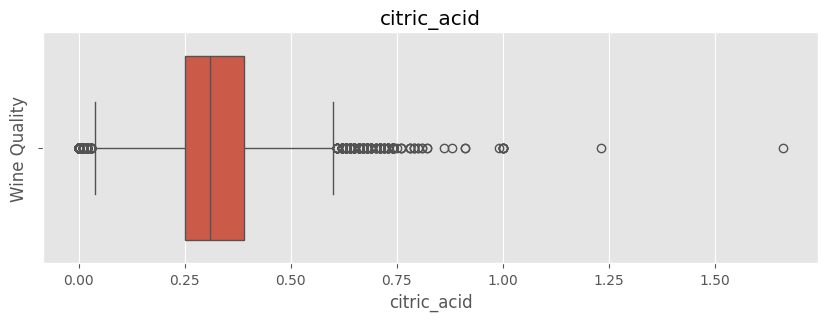

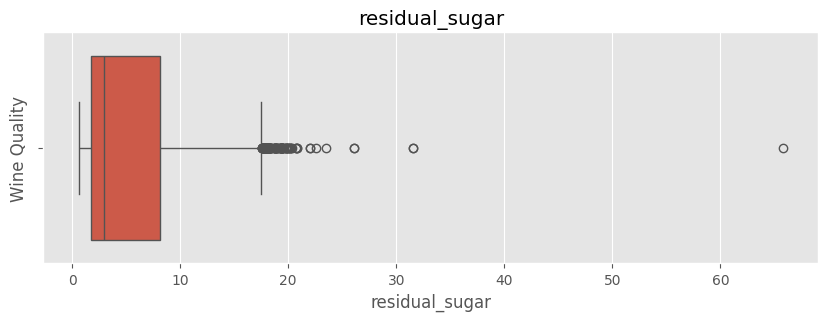

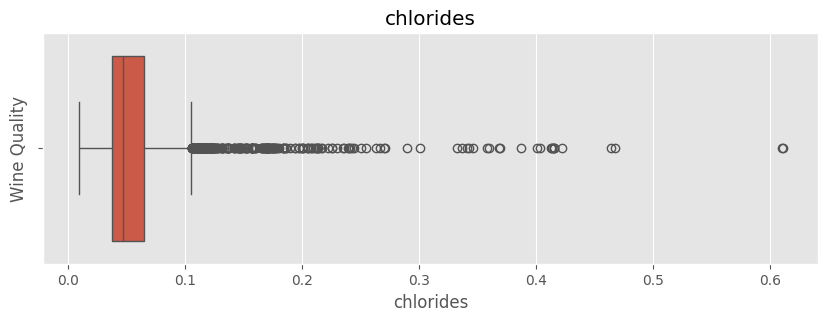

...

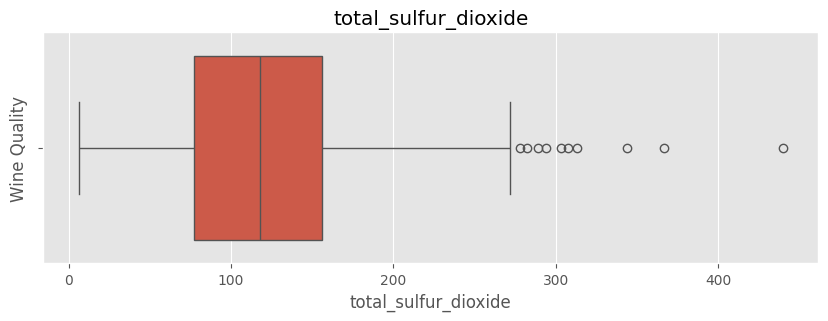

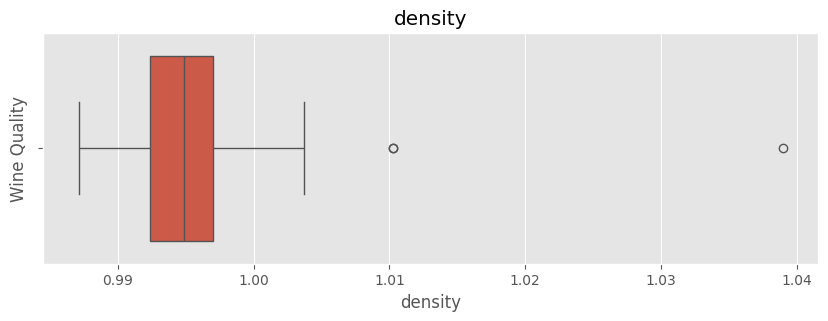

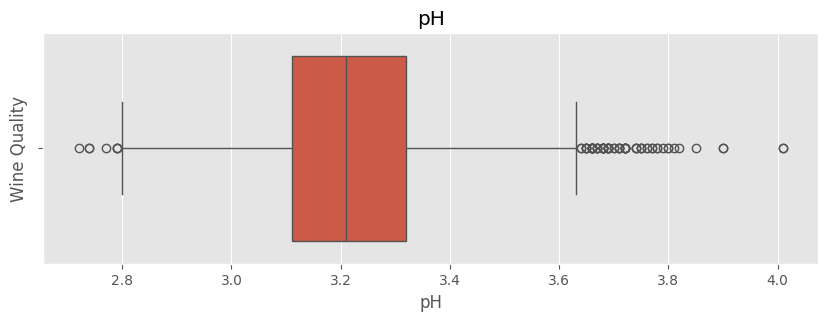

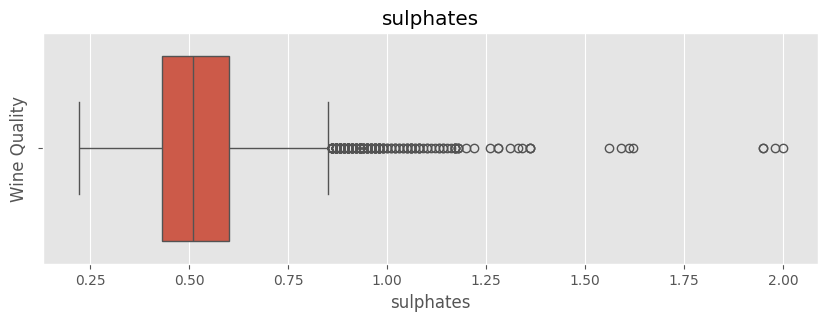

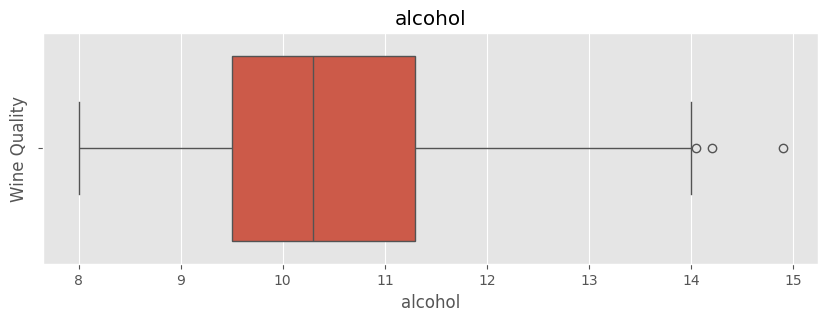

In [10]:
for column in wq_X.columns:
    plt.figure(figsize = (10,3))
    plt.title(column)
    sns.boxplot(wq_X[column], orient='y')
    plt.ylabel('Wine Quality')
    plt.xlabel(column)

Here all the features of the dataset have outliers present in them. 

Next, we remove the outliers using the $1.5 * IQR$ rule. Here we the cap the values according to the lower elimit and upper lemit.

In [11]:
def remove_outlier(df, columns):
    df_copy = df.copy()
    for column in columns:
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1

        upper_limit = q3 + (1.5 * iqr)
        lower_limit = q1 - (1.5 * iqr)

        df_copy.loc[df[column] > upper_limit, column] = upper_limit
        df_copy.loc[df[column] < lower_limit, column] = lower_limit
    return df_copy

Created a new dataframe from the features dataframe after removing outliers

In [12]:
new_df = remove_outlier(wq_X, wq_X.columns)

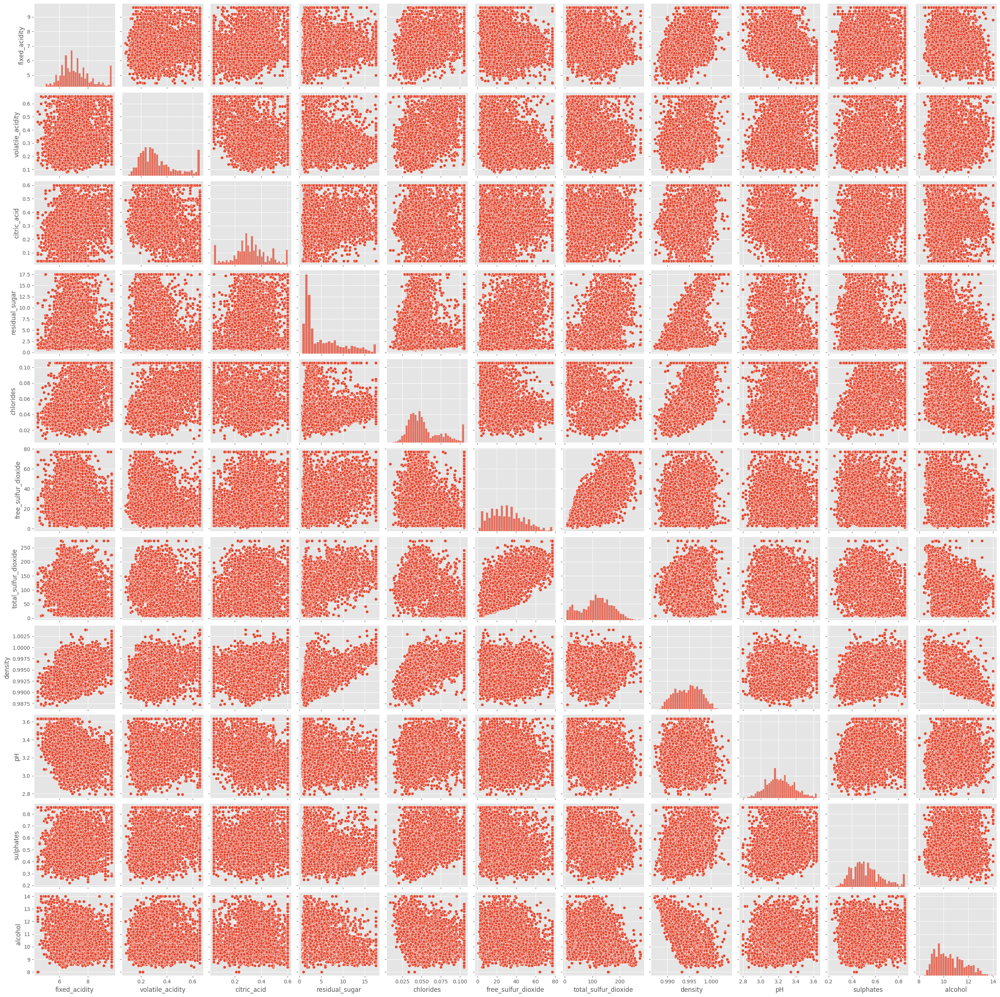

In [16]:
sns.pairplot(new_df)

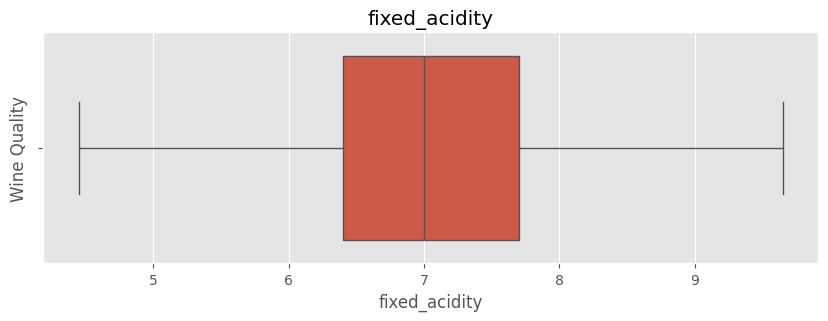

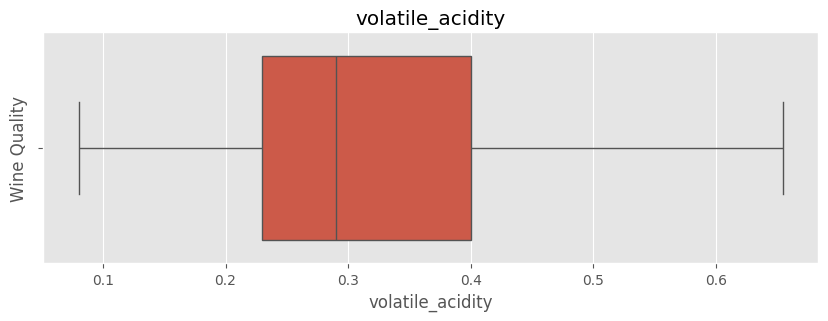

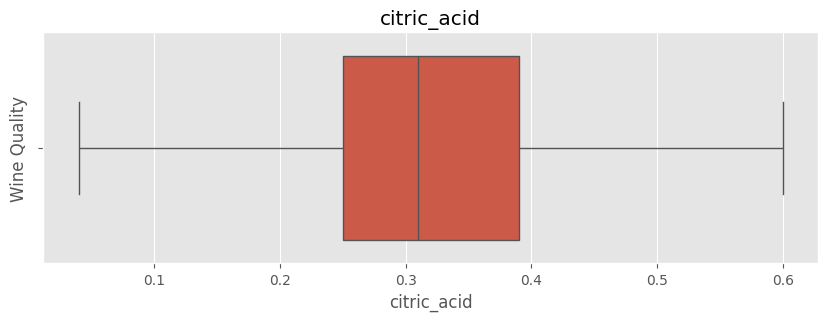

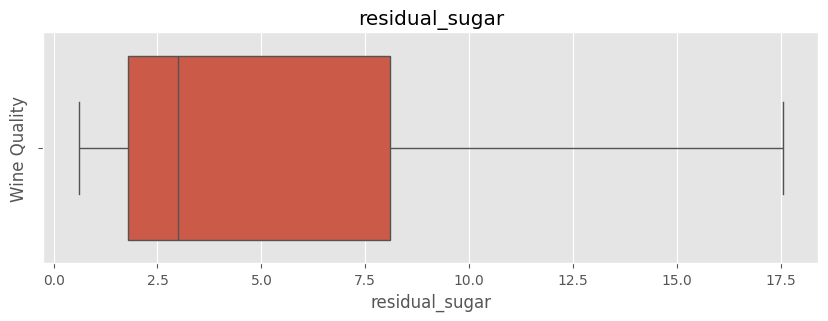

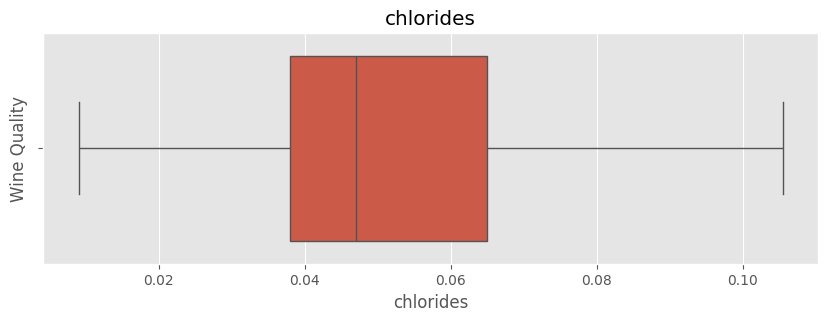

...

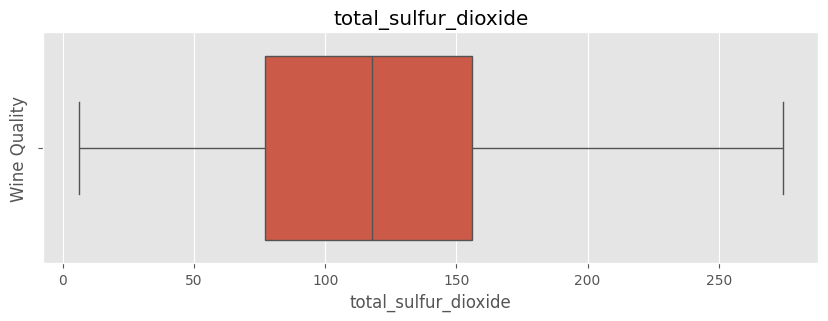

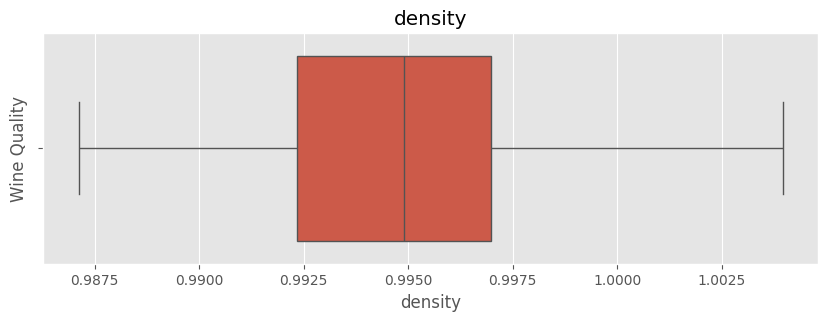

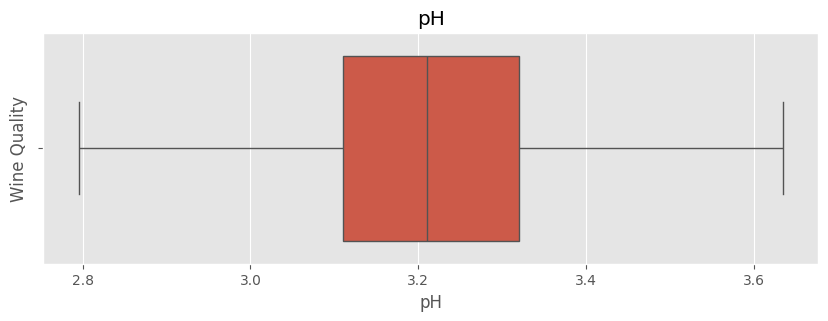

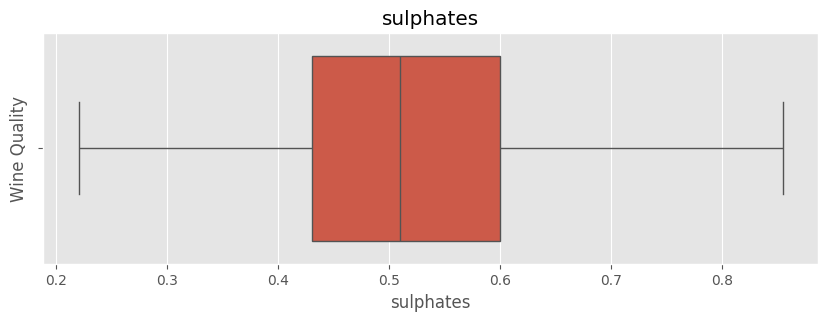

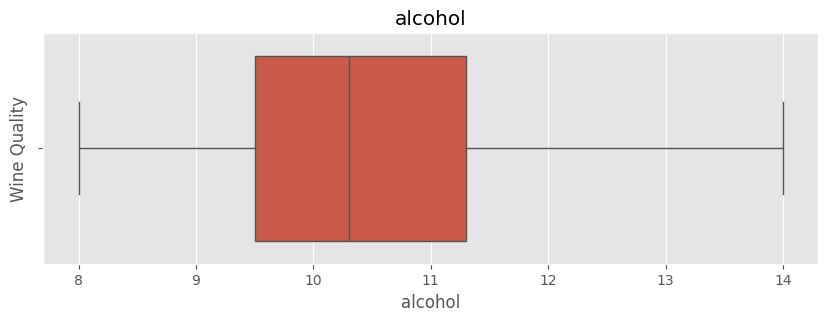

In [13]:
for column in new_df.columns:
    plt.figure(figsize = (10,3))
    plt.title(column)
    sns.boxplot(new_df[column], orient='y')
    plt.ylabel('Wine Quality')
    plt.xlabel(column)

We can run the below code to remove the skewness in some of the features and transform them into a normal distribution

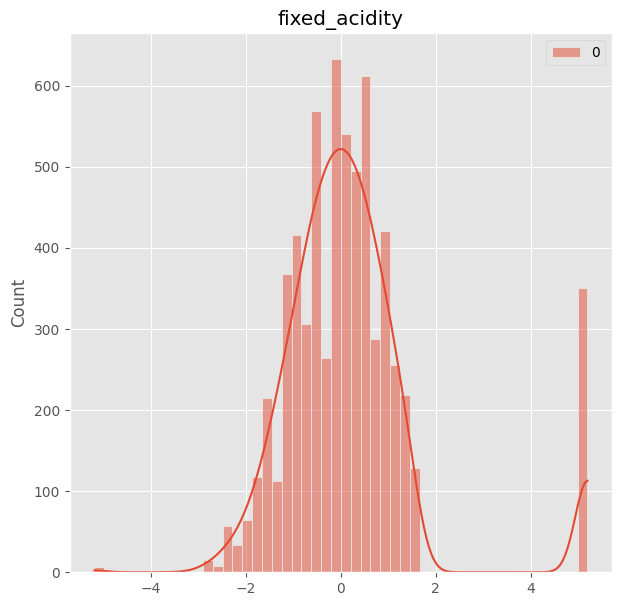

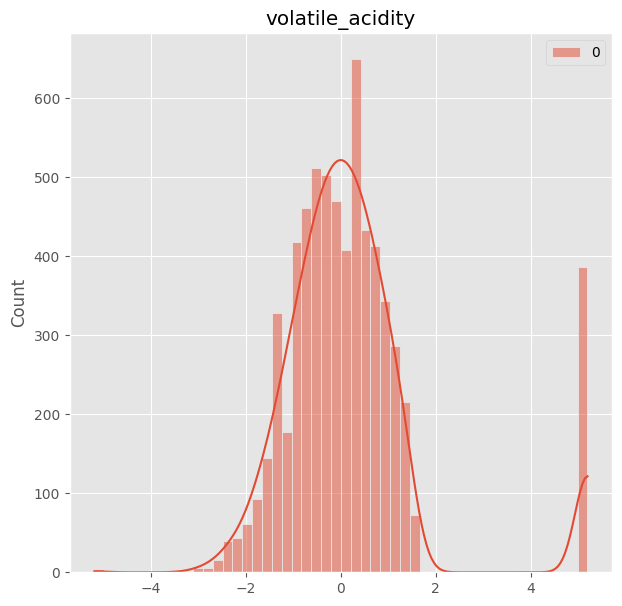

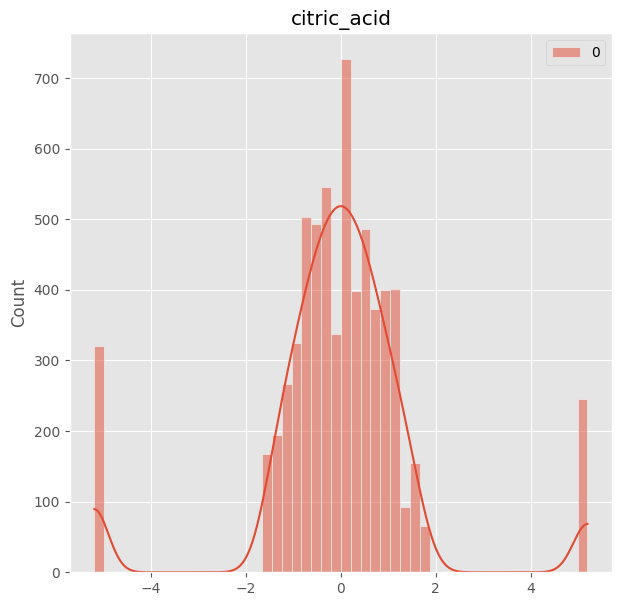

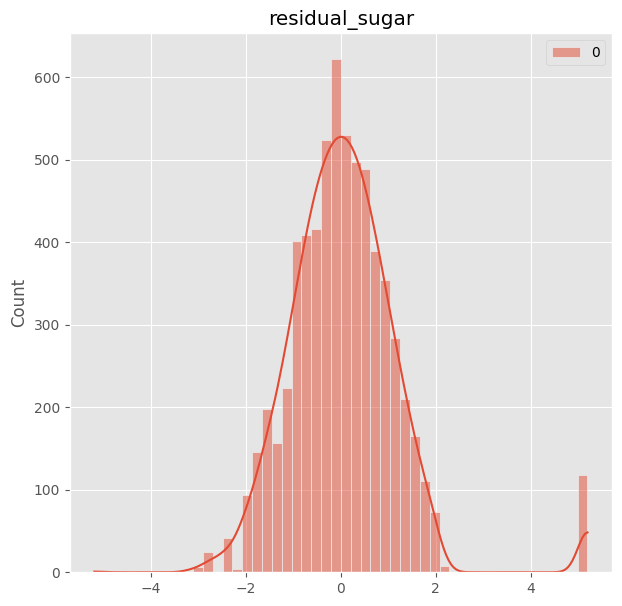

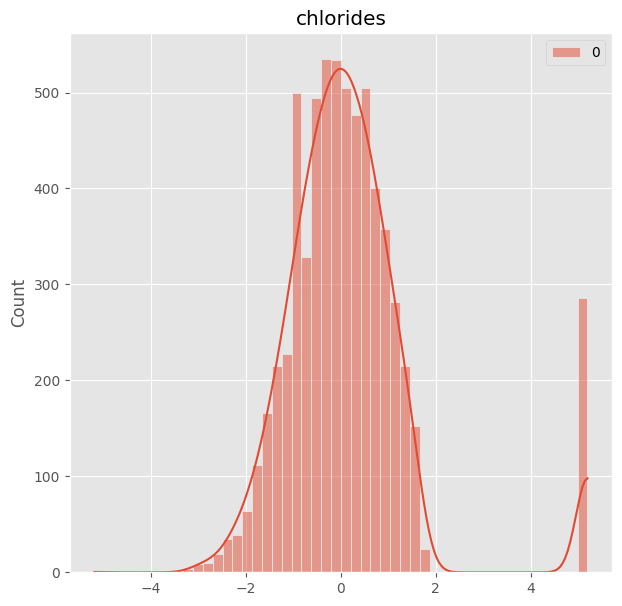

...

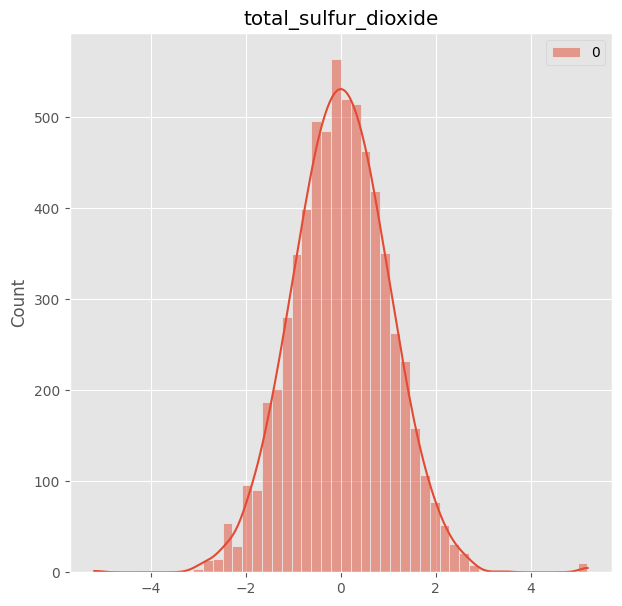

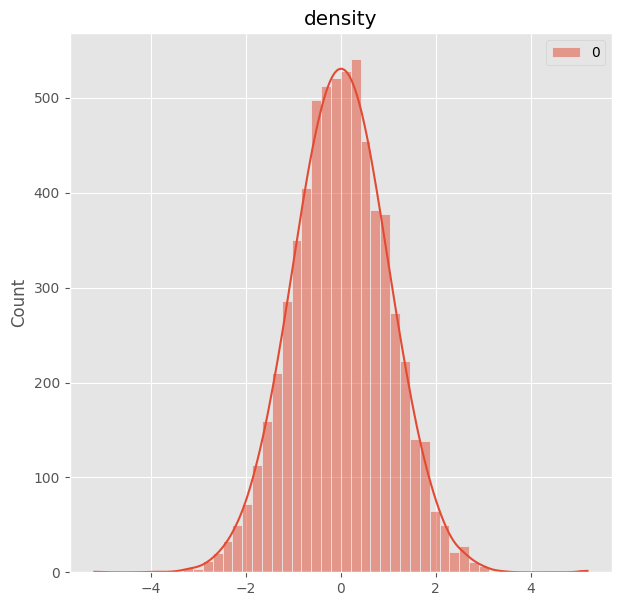

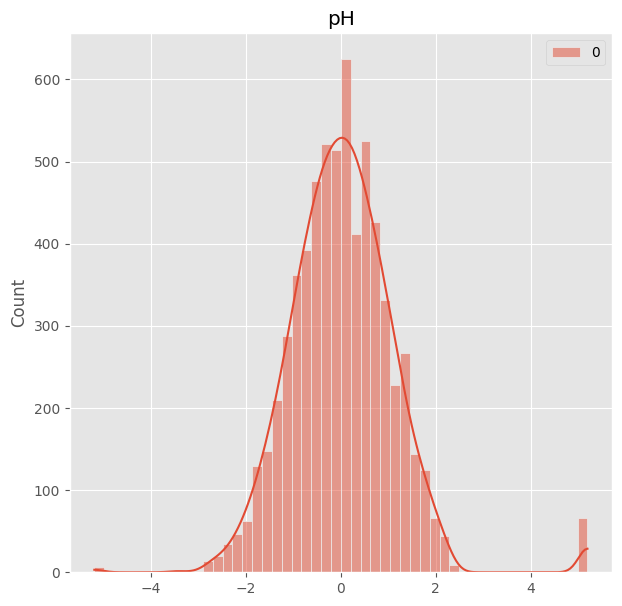

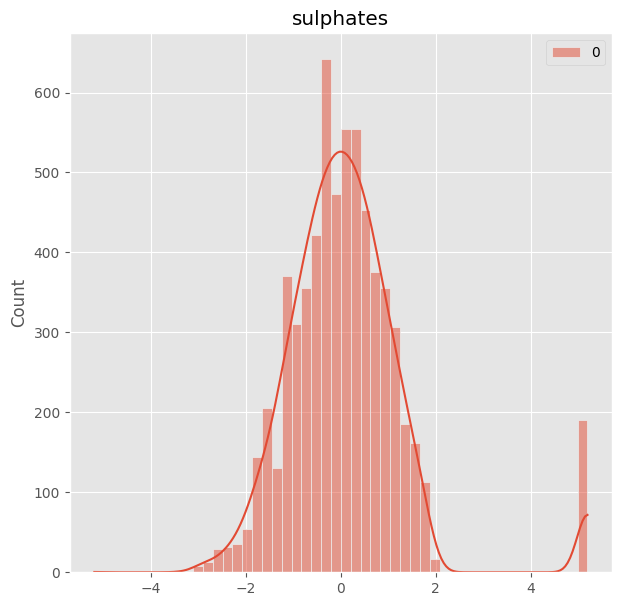

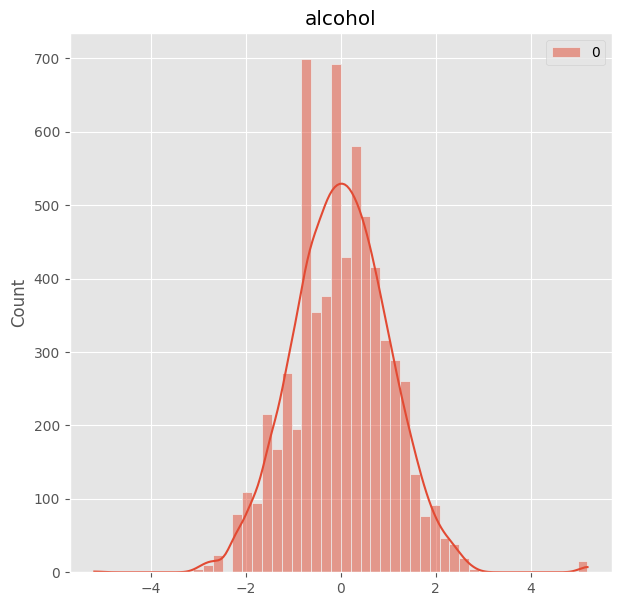

In [24]:
qt = QuantileTransformer(n_quantiles=500, output_distribution='normal')
for column in new_df.columns:
    array = new_df[column].to_numpy().reshape(-1,1)
    x = qt.fit_transform(array)
    new_df[column] = qt.fit_transform(new_df[column].to_numpy().reshape(-1,1))
    plt.figure(figsize = (7,7))
    plt.title(column)
    sns.histplot(x, kde=True, bins = 50)

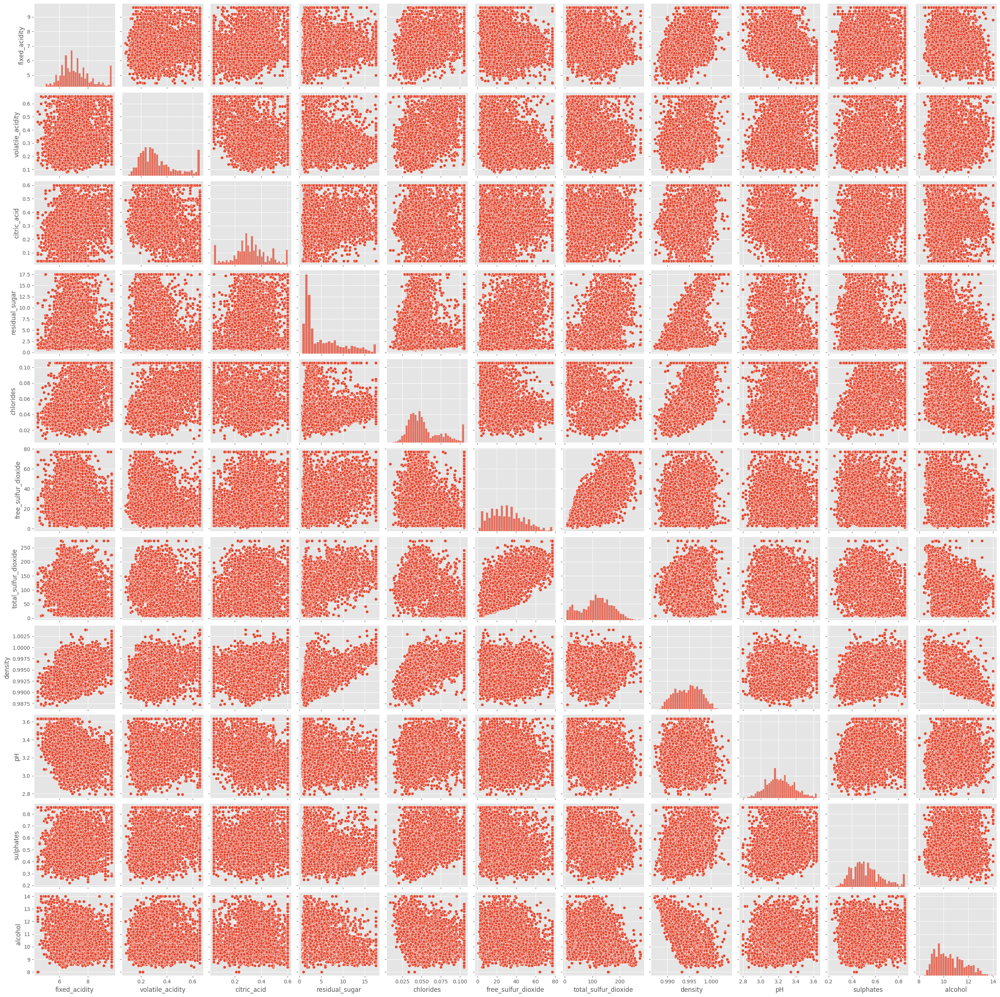

In [54]:
sns.pairplot(new_df)

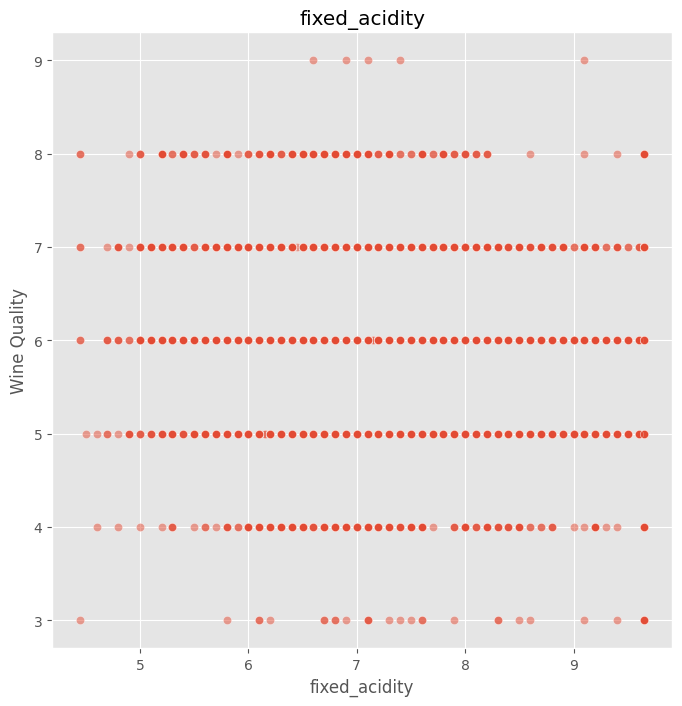

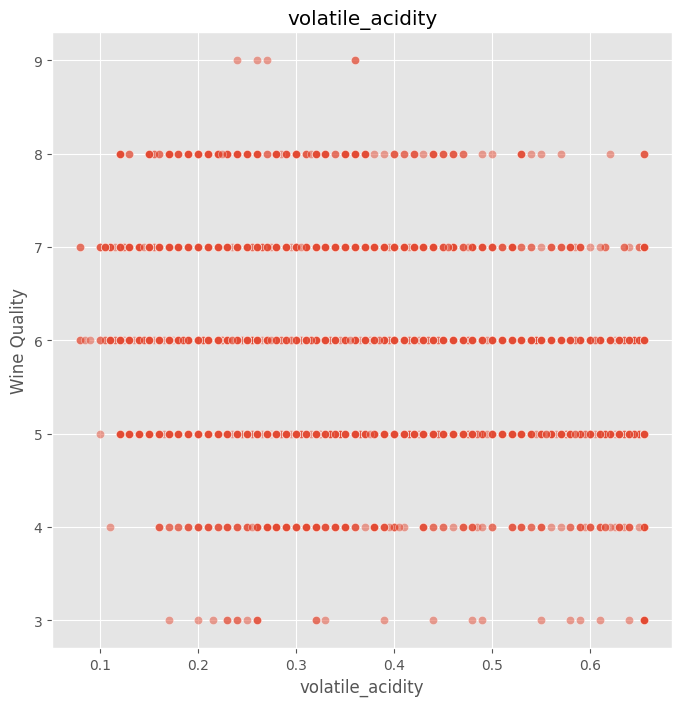

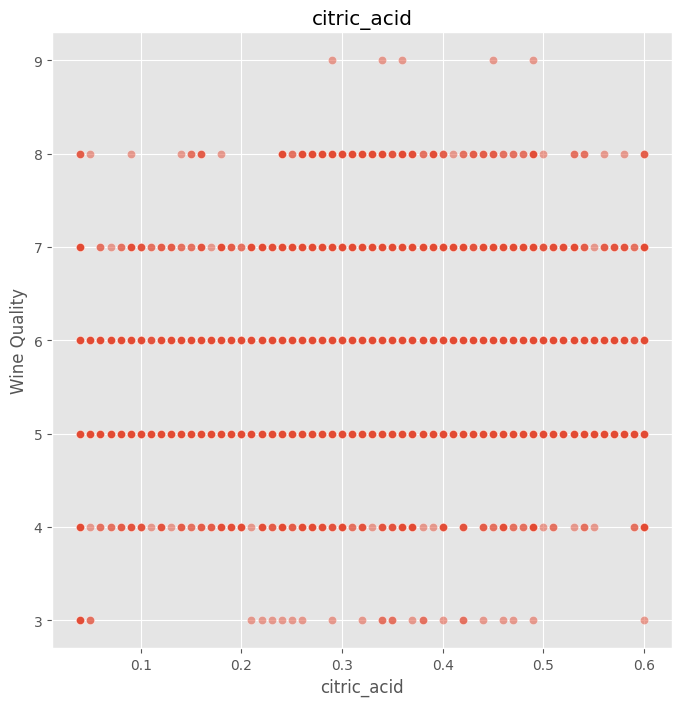

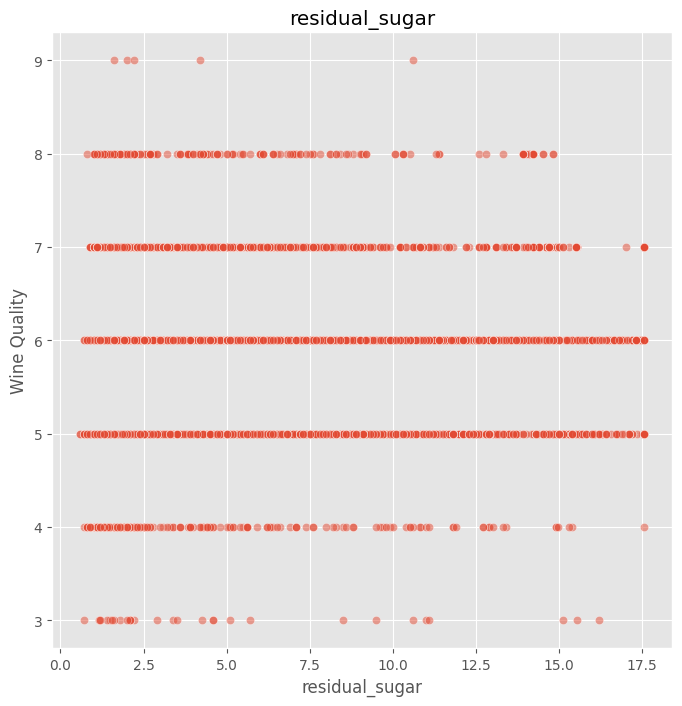

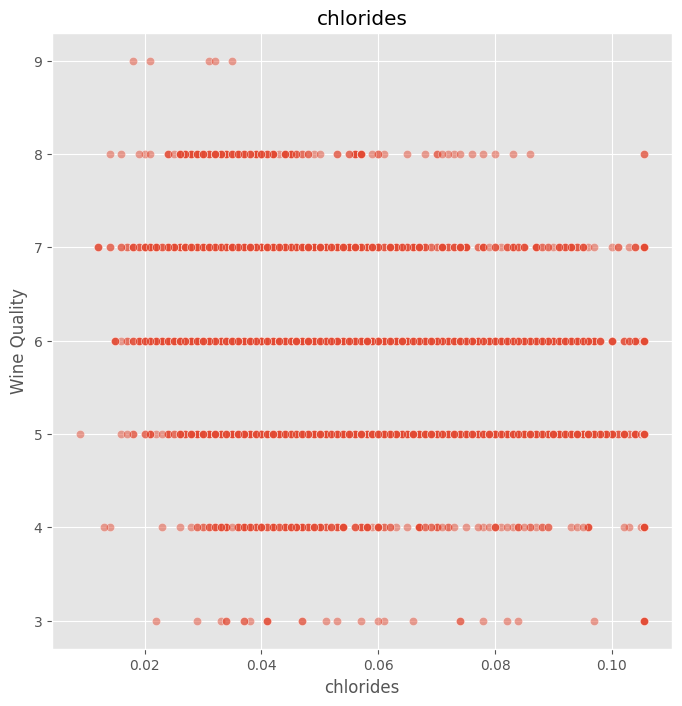

...

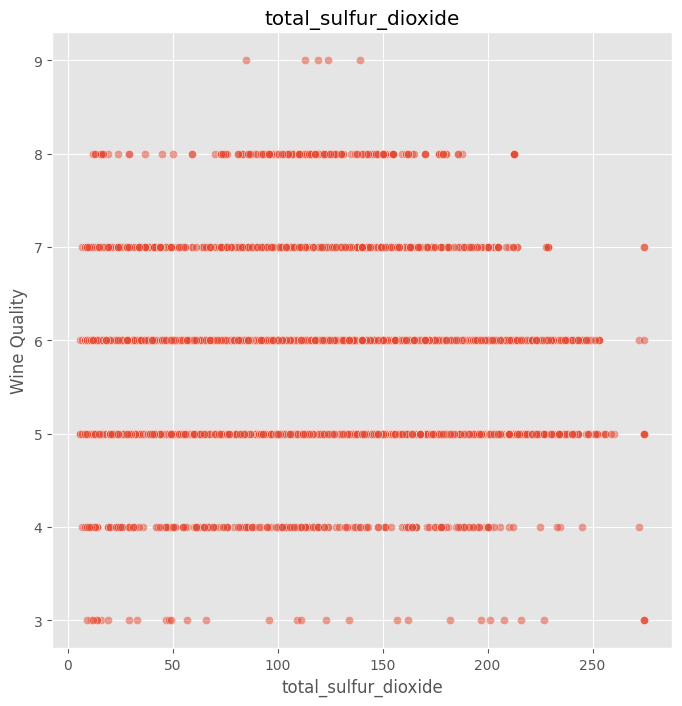

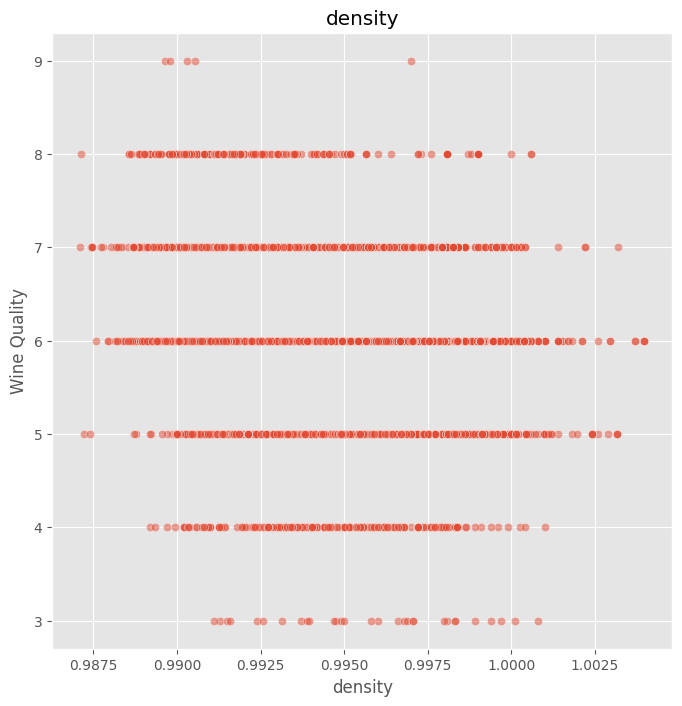

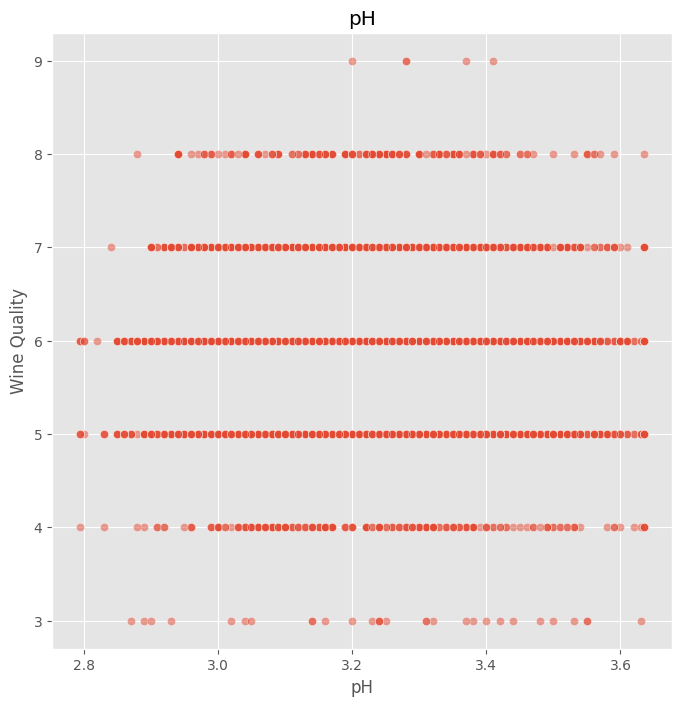

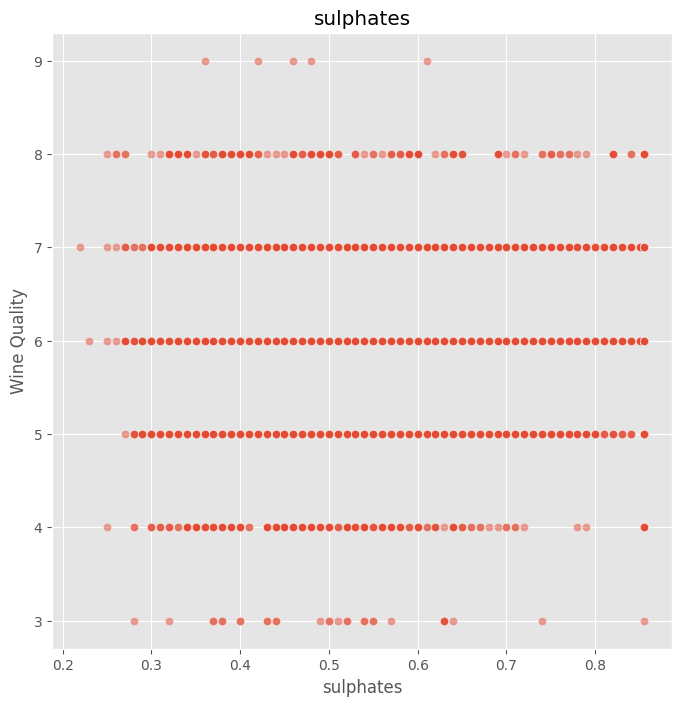

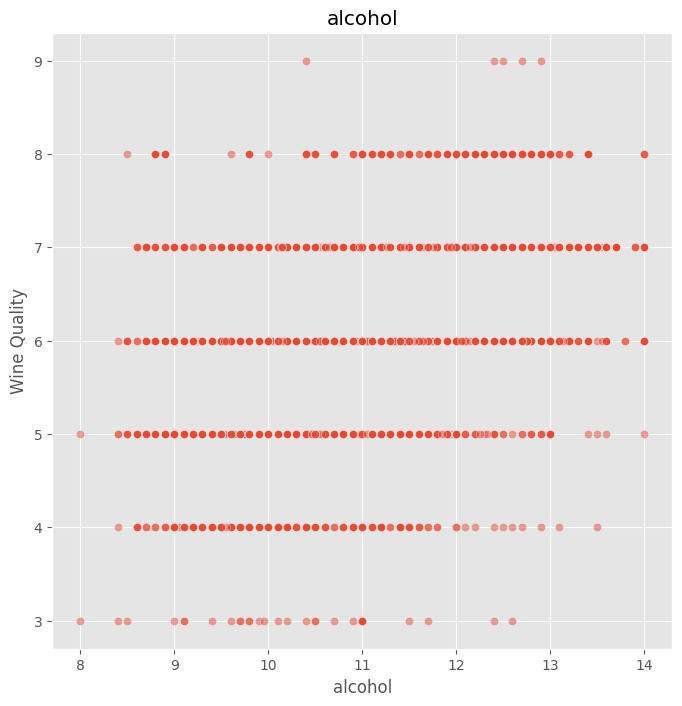

In [14]:
combined = pd.concat([new_df, wq_y], axis=1)
for column in new_df.columns:
    # column = wq_X_copy[column].to_numpy().ravel()
    plt.figure(figsize = (8,8))
    plt.title(column)
    sns.scatterplot(x=column, y="quality", alpha=0.5, data=combined)
    plt.ylabel('Wine Quality')
    plt.xlabel(column)
plt.show()

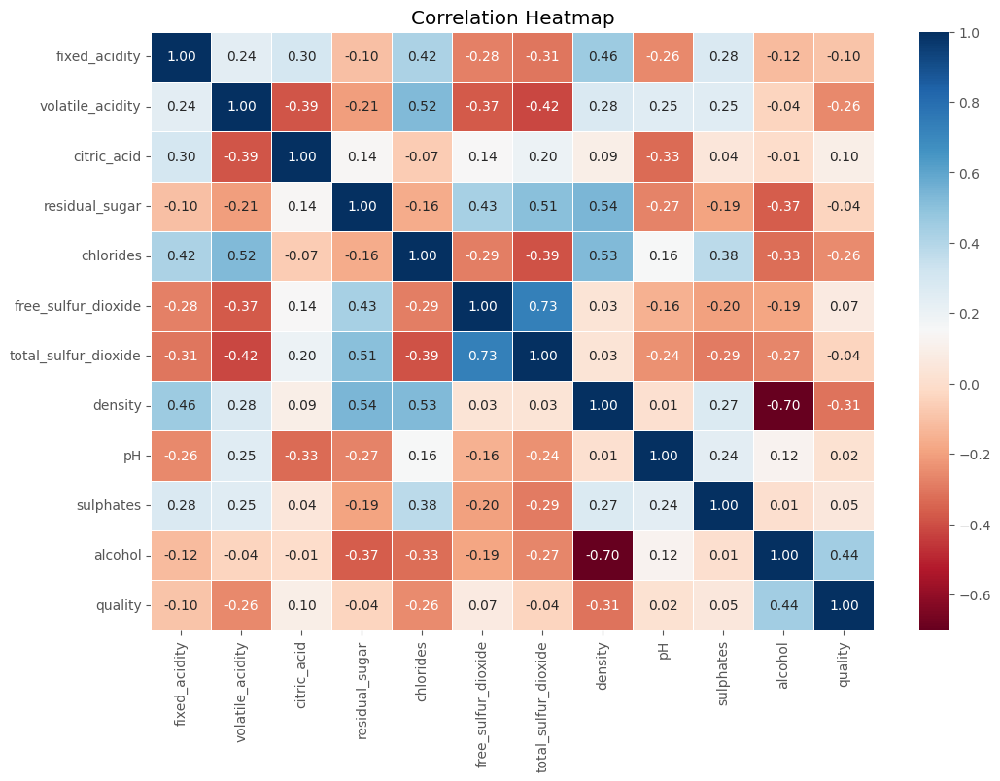

In [15]:
corr = combined.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='RdBu', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [16]:
scaler = StandardScaler()
new_df_scaled = scaler.fit_transform(new_df)

In [17]:
new_df_scaled

array([[ 0.2418641 ,  2.2331519 , -2.09471447, ...,  1.85169992,
         0.25409083, -0.91575791],
       [ 0.61709927,  2.2331519 , -2.09471447, ..., -0.11171274,
         1.16882486, -0.58019986],
       [ 0.61709927,  2.2331519 , -2.09471447, ...,  0.26830261,
         0.94014135, -0.58019986],
       ...,
       [-0.60241502, -0.64151455, -0.95702374, ..., -1.44176647,
        -0.50818753, -0.91575791],
       [-1.54050294, -0.29516919, -0.1227172 , ...,  0.77498975,
        -1.11801022,  1.93648552],
       [-1.07145898, -0.84932176,  0.48405119, ...,  0.26830261,
        -1.57537723,  1.0975904 ]], shape=(6497, 11))

In [77]:
wq_y.to_numpy().flatten()[:50].shape

(50,)

Performing Linear Discriminant Analysis on the scaled dataset.

In [21]:
lda = LinearDiscriminantAnalysis(solver='svd')
lda_transformed = lda.fit_transform(new_df_scaled, wq_y.to_numpy().flatten())
lda.explained_variance_ratio_


array([0.90469665, 0.06381106, 0.01876095, 0.00675753, 0.00435832,
       0.0016155 ])

In [56]:
combined_1 = np.append(new_df_scaled, wq_y.to_numpy().flatten().reshape(-1,1), axis=1)

In [58]:
lda1_transformed = lda.transform(new_df_scaled)

In [72]:
lda1_transformed[:50, 1].shape

(50,)

In [69]:
lda1_transformed[:, 0]

array([-2.07352507, -1.61486697, -1.72788901, ..., -0.95701947,
        1.62074923,  1.04037704], shape=(6497,))

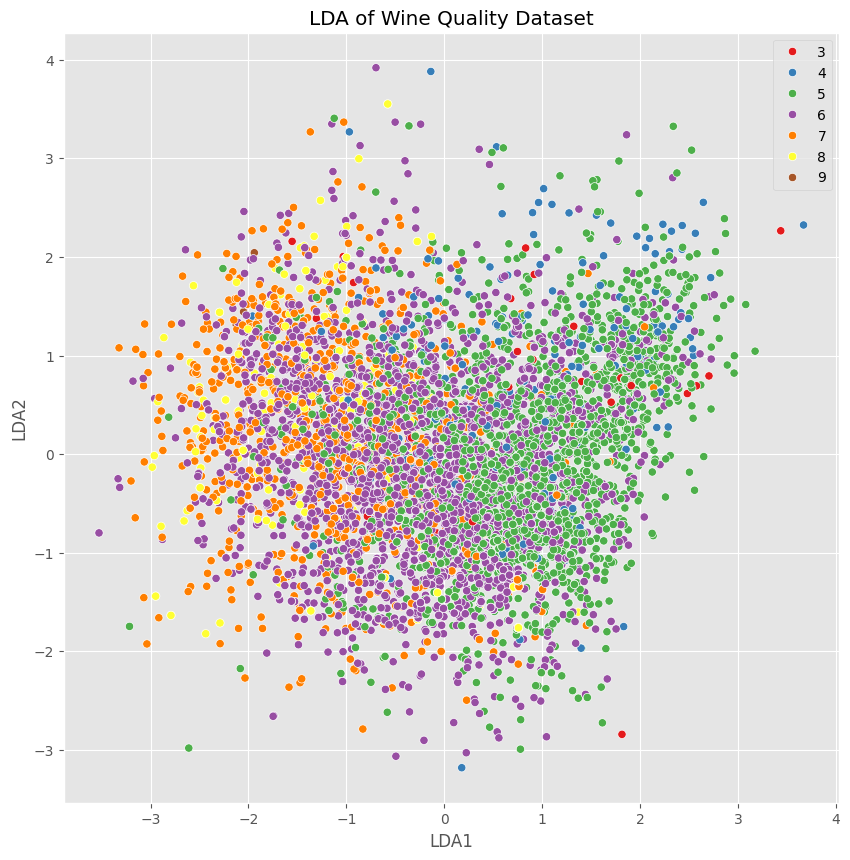

In [31]:

plt.figure(figsize=(10, 10))
plt.xlabel('LDA1')
plt.ylabel('LDA2')
sns.scatterplot(x = lda_transformed[:, 0], y = lda_transformed[:, 1], hue = wq_y.to_numpy().flatten(), palette = 'Set1')
plt.title('LDA of Wine Quality Dataset')
plt.show()

In [23]:
fig = px.scatter_3d(
    x=lda_transformed[:, 0],
    y=lda_transformed[:, 1],
    z=lda_transformed[:, 2],
    symbol=wq_y.to_numpy().flatten(),
    color=wq_y.to_numpy().flatten(),
    labels={'x': 'LDA1', 'y': 'LDA2', 'z': 'LDA3'},
    title='3D PCA Scatter Plot',
    color_continuous_scale=px.colors.sequential.Blackbody
)
fig.update_layout(margin=dict(l = 0, r = 0, b = 0, t =100), width = 1000, height = 800)

dataset 2

In [1]:
from sklearn.datasets import load_wine

In [13]:
wine = load_wine()
wine_df_X = pd.DataFrame(data=wine.data, columns=wine.feature_names)
wine_df_y = pd.DataFrame(data=wine.target, columns=["target"])

In [21]:
wine_df_X

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


In [15]:
wine_df_y

,target
0,0
1,0
2,0
3,0
4,0
...,...
173,2
174,2
175,2
176,2


In [16]:
wine_df_X.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


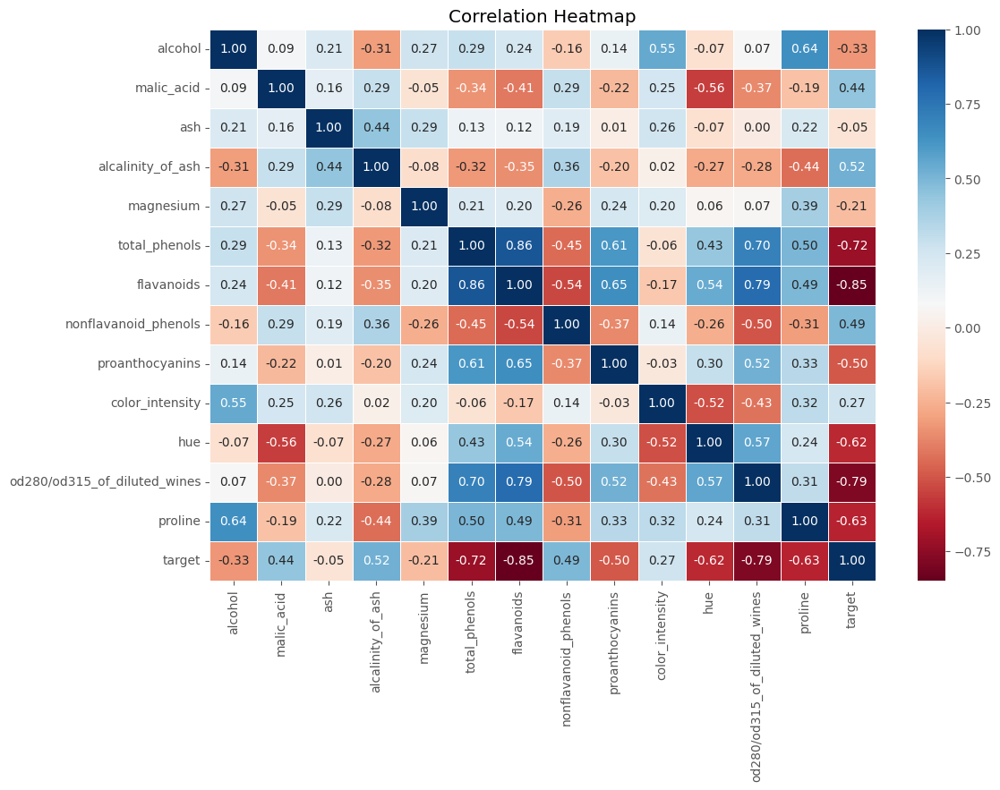

In [18]:
combined = pd.concat([wine_df_X, wine_df_y], axis=1)
combined.corr()
plt.figure(figsize = (12, 8))
sns.heatmap(combined.corr(), annot=True, cmap='RdBu', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

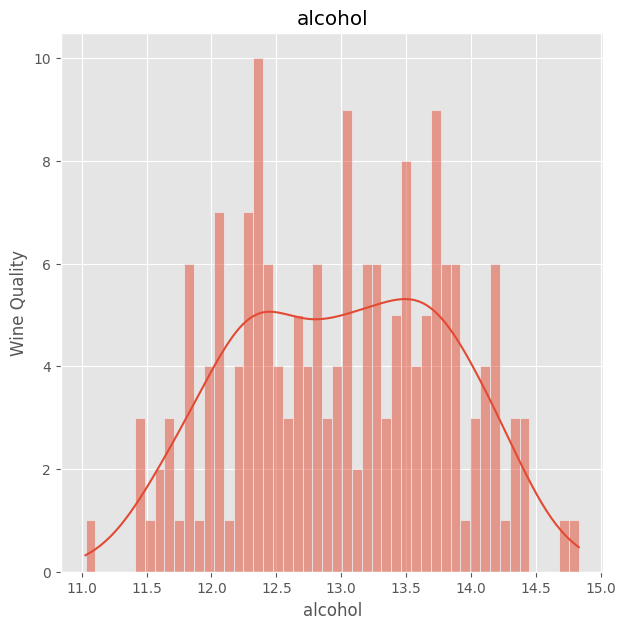

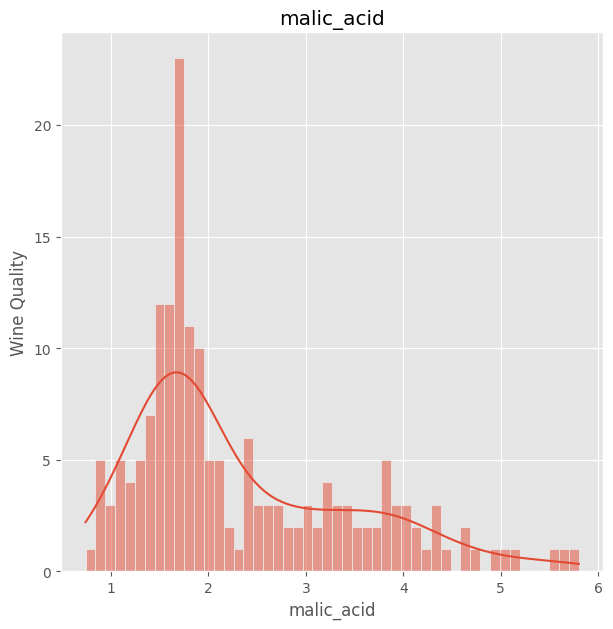

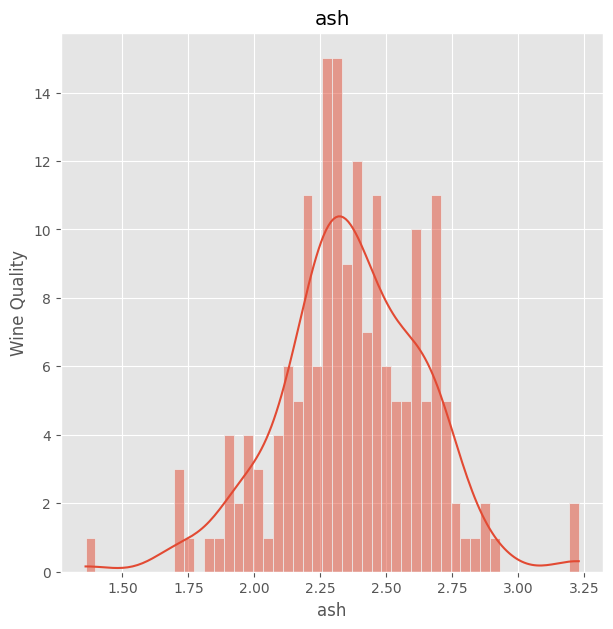

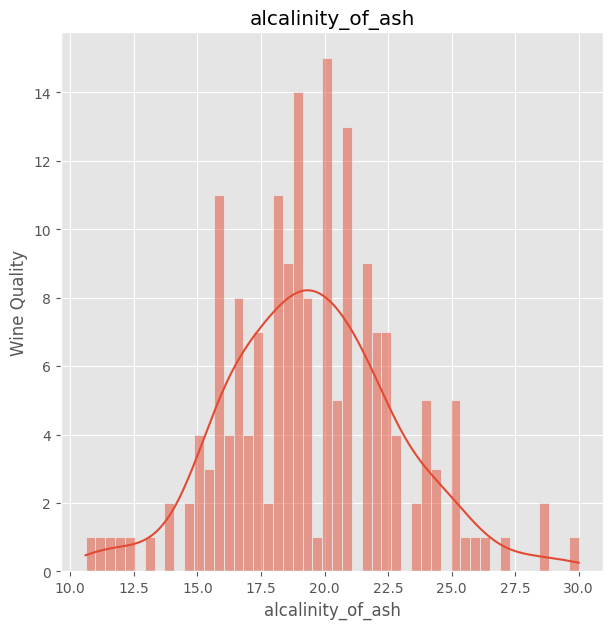

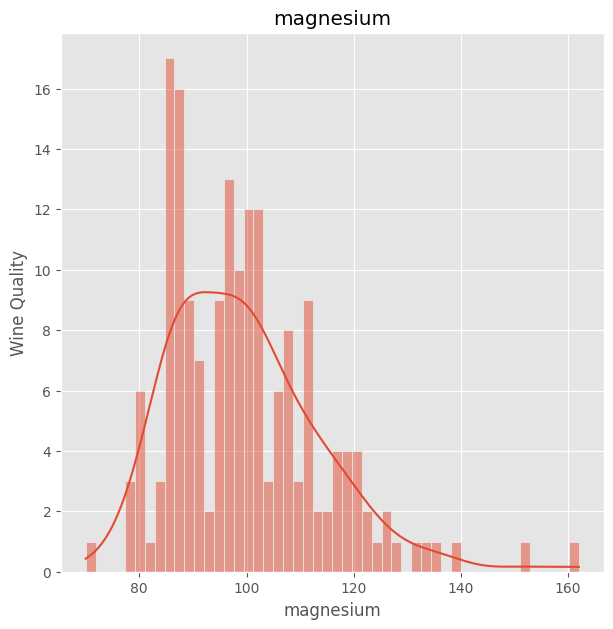

...

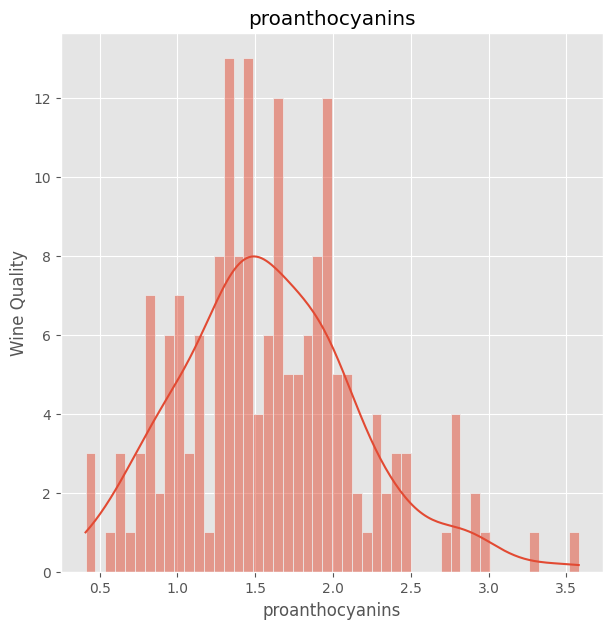

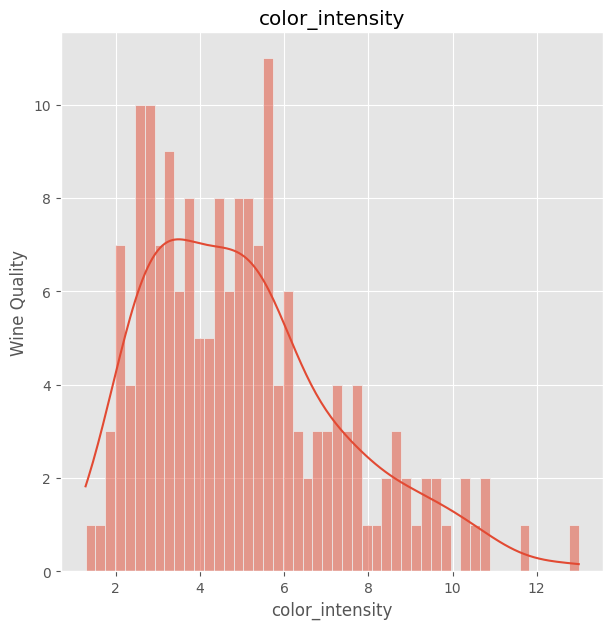

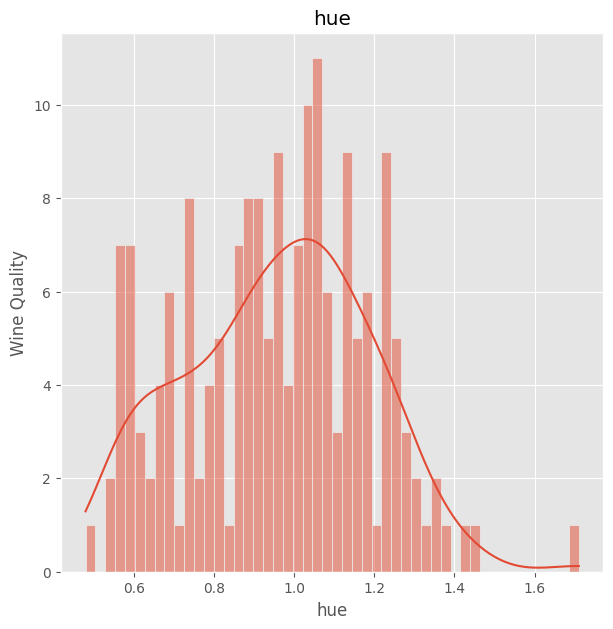

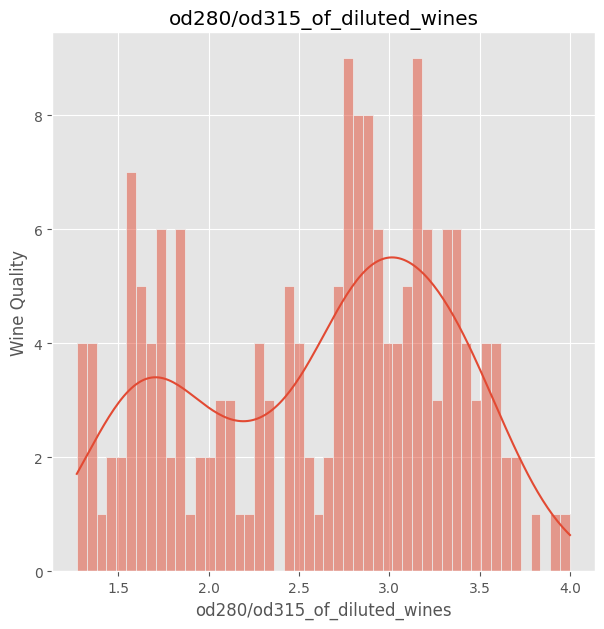

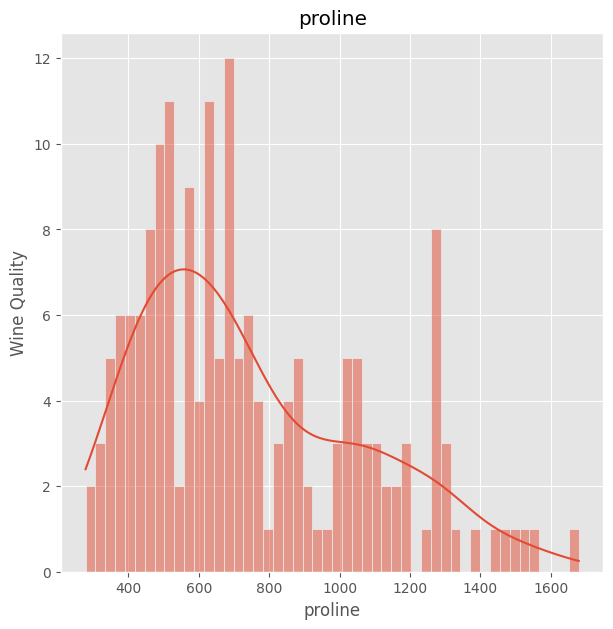

In [19]:
for column in wine_df_X.columns:
    plt.figure(figsize = (7,7))
    plt.title(column)
    sns.histplot(wine_df_X[column], kde=True, bins = 50)
    plt.ylabel('Wine Quality')
    plt.xlabel(column)

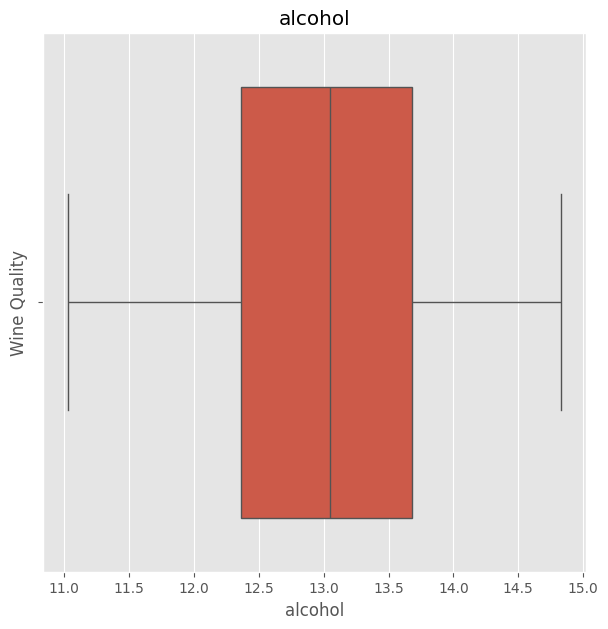

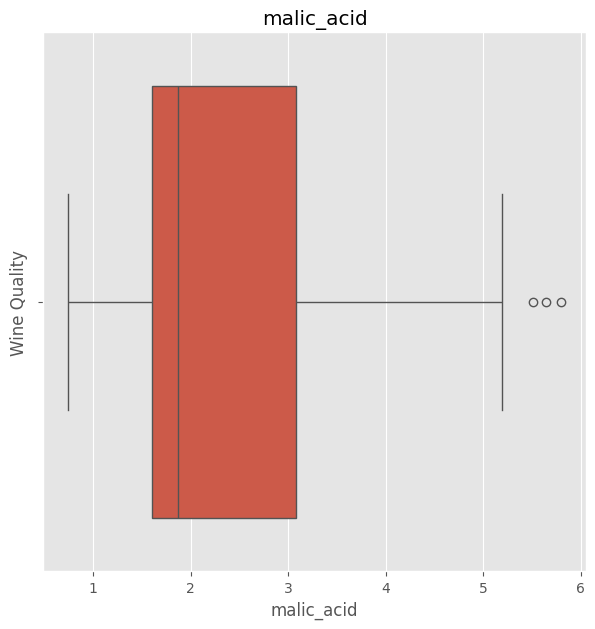

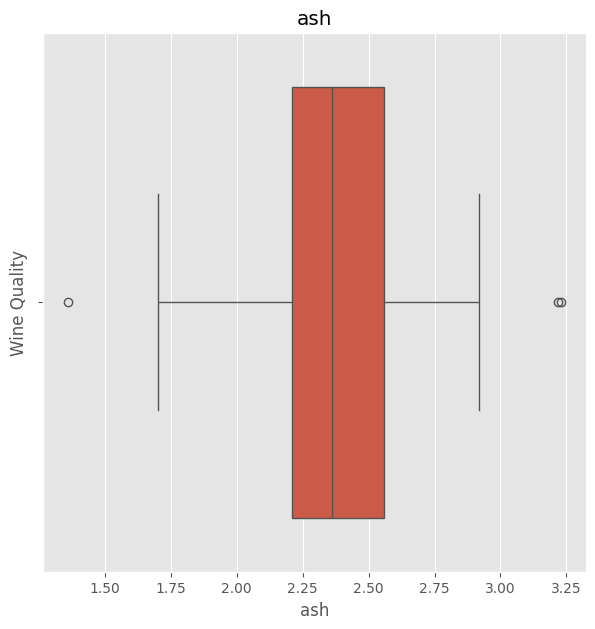

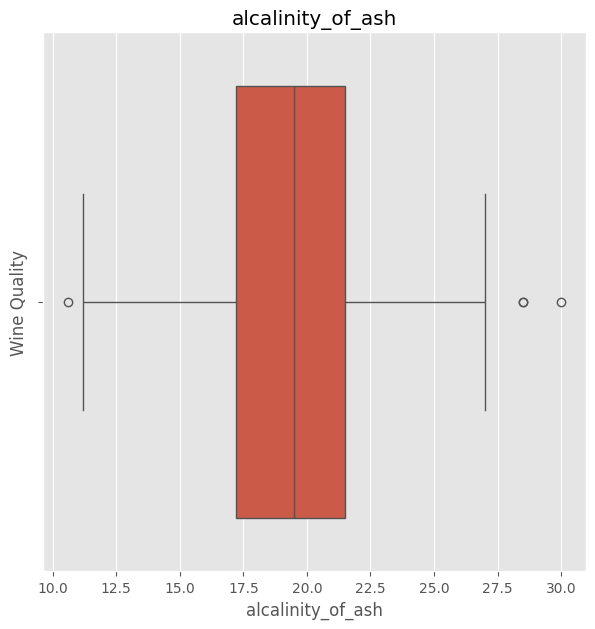

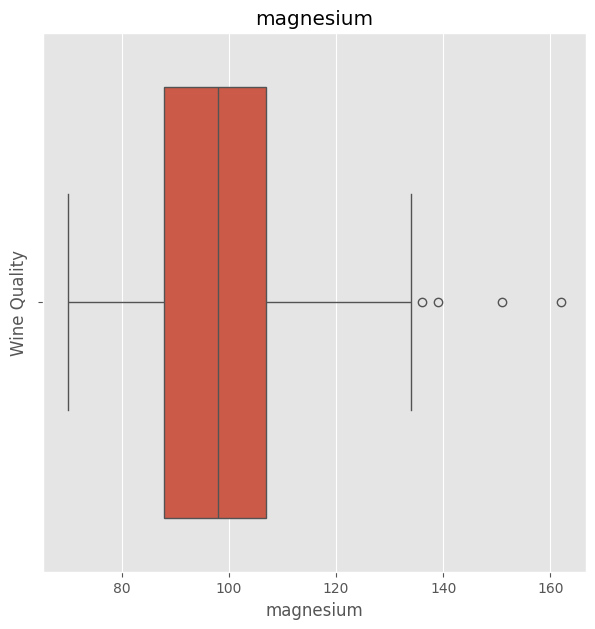

...

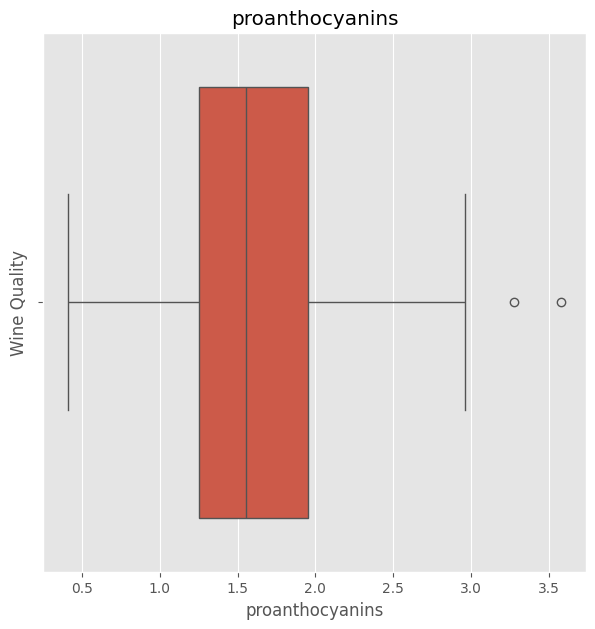

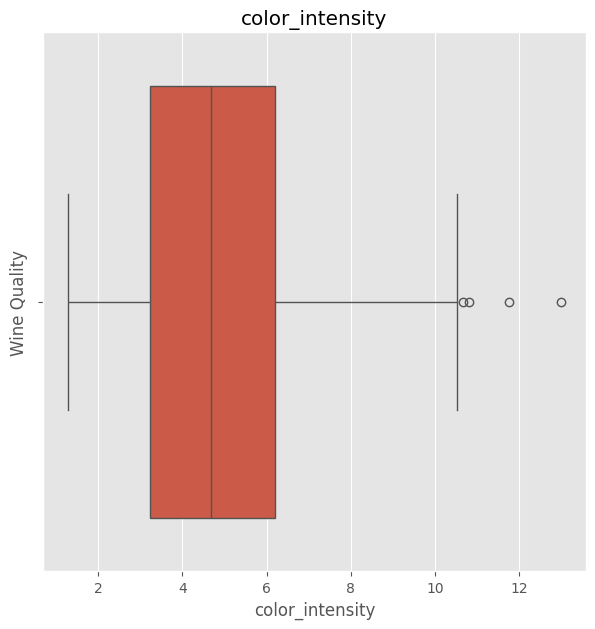

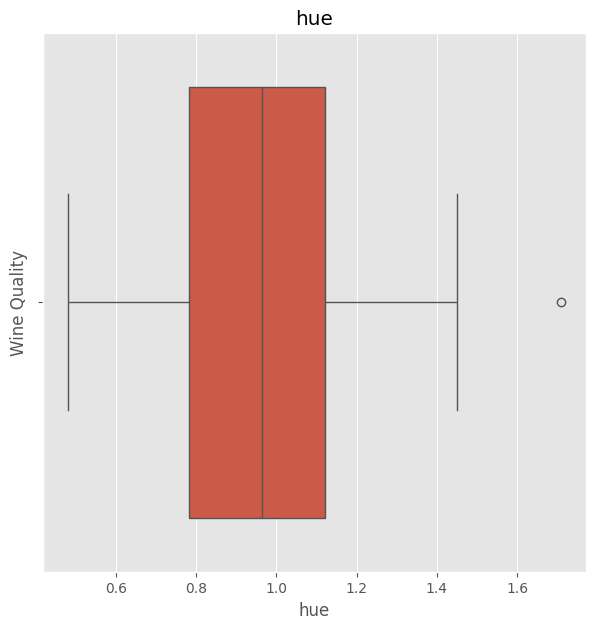

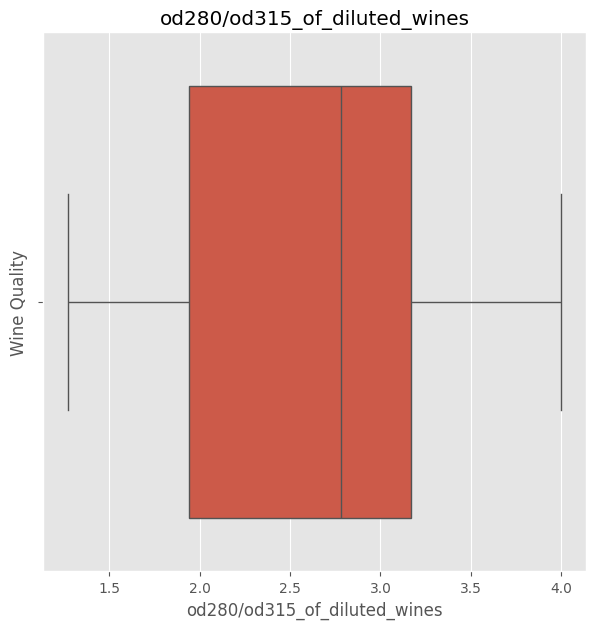

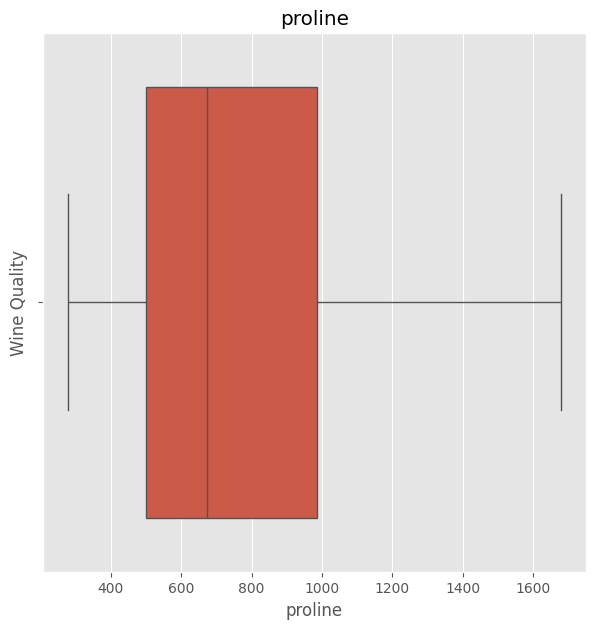

In [20]:
for column in wine_df_X.columns:
    plt.figure(figsize = (7,7))
    plt.title(column)
    sns.boxplot(wine_df_X[column], orient='y')
    plt.ylabel('Wine Quality')
    plt.xlabel(column)

In [22]:
scaler_1 = StandardScaler()
wine_df_X_scaled = scaler_1.fit_transform(wine_df_X)

In [23]:
wine_df_X_scaled

array([[ 1.51861254, -0.5622498 ,  0.23205254, ...,  0.36217728,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.49941338, -0.82799632, ...,  0.40605066,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02123125,  1.10933436, ...,  0.31830389,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.74474449, -0.38935541, ..., -1.61212515,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.22769377,  0.01273209, ..., -1.56825176,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.58316512,  1.36520822, ..., -1.52437837,
        -1.42894777, -0.59516041]], shape=(178, 13))

In [26]:
lda = LinearDiscriminantAnalysis(solver='svd')
lda_transformed = lda.fit_transform(wine_df_X_scaled, wine_df_y.to_numpy().flatten())
lda.explained_variance_ratio_

array([0.68747889, 0.31252111])

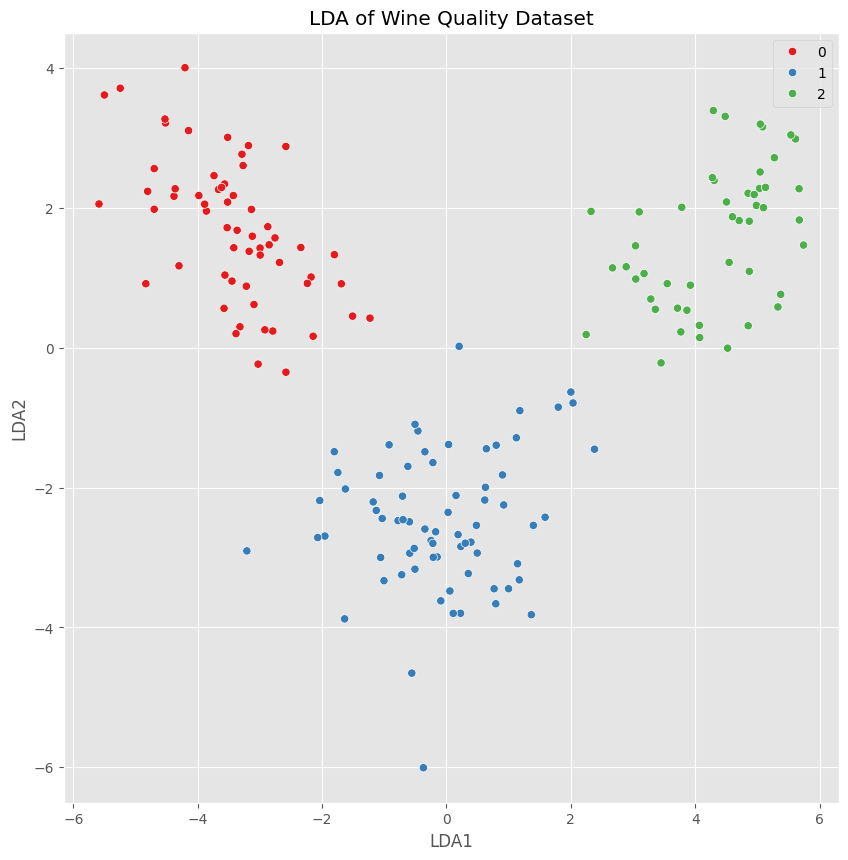

In [27]:
plt.figure(figsize=(10, 10))
plt.xlabel('LDA1')
plt.ylabel('LDA2')
sns.scatterplot(x = lda_transformed[:, 0], y = lda_transformed[:, 1], hue = wine_df_y.to_numpy().flatten(), palette = 'Set1')
plt.title('LDA of Wine Quality Dataset')
plt.show()